# Unsupervised Capstone: Movie recommendation system
----------------------------------------------

![alt text][logo]

[logo]: https://www.vshsolutions.com/wp-content/uploads/2020/02/recommender-system-for-movie-recommendation.jpg 

## Context:

Recommendation system has long become an essential part of any business and e-commerce. It plays an important role in not only supporting customers making optimal decisions, but also improving business operations.

Whether you want to introduce people among themselves in your social network, try to recommend a similarly purchased item to the customers or need a hint for yourself which movie to watch in the evening, there are unlimited possibilities to apply recommendation engines/systems around us.

In this notebook we will explore and compare different algorithms and approaches to movies recommendation.

This dataset(including multiple files) was downloaded from [Kaggle](https://www.kaggle.com/rounakbanik/the-movies-dataset), and it contains metadata for all 45,000 movies. The dataset consists of movies released on or before July 2017. Data points include cast, crew, plot keywords, budget, revenue, posters, release dates, languages, production companies, countries, TMDB vote counts and vote averages.

## Content:

This dataset has files containing 26 million ratings from 270,000 users for all 45,000 movies. Ratings are on a scale of 1-5 and have been obtained from the official GroupLens website.

The files included are:

* **movies_metadata.csv**: The main Movies Metadata file. Contains information on 45,000 movies featured in the Full MovieLens dataset. Features include posters, backdrops, budget, revenue, release dates, languages, production countries and companies.

* **keywords.csv**: Contains the movie plot keywords for our MovieLens movies. Available in the form of a stringified JSON Object.

* **credits.csv**: Consists of Cast and Crew Information for all our movies. Available in the form of a stringified JSON Object.

* **links.csv**: The file that contains the TMDB and IMDB IDs of all the movies featured in the Full MovieLens dataset.

* **links_small.csv**: Contains the TMDB and IMDB IDs of a small subset of 9,000 movies of the Full Dataset.

* **ratings_small.csv**: The subset of 100,000 ratings from 700 users on 9,000 movies.

## Kernel directory:

I. Import libraries and load the dataset:  
    * Data cleaning 
    * Data imputation
    * Feature extraction

II. Exploratory Data Analysis:
    * Numerical feature analysis
    * Categorical & text feature analysis
    * Feature transformation

III. Build recommendation system:
    * Popularity-based recommender using weighted rating
    * Content-based recommender using cosine similarity
    * Content-based recommender using Kmeans


----------------------------------------------------------------


### I. Import libraries and load the dataset:
####  Import libraries:

In [1]:
# Import libraries:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from ast import literal_eval

import nltk
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans, MiniBatchKMeans, DBSCAN
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import PCA
from sklearn import metrics
import umap

# Pandas display preferences
%matplotlib inline
warnings.filterwarnings('ignore')

pd.options.display.float_format = '{:.3f}'.format
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# Plotly visualization
import plotly.offline as py
from plotly.offline import iplot, init_notebook_mode
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots
py.init_notebook_mode(connected = True) # Required to use plotly offline in jupyter notebook

import cufflinks as cf #importing plotly and cufflinks in offline mode  
import plotly.offline  
cf.go_offline()  
cf.set_config_file(offline=False, world_readable=True)

####  Load the dataset:

In [2]:
# Load the movie_metadata dataset
df1 = pd.read_csv('movies_metadata.csv')

# Inspect the dataset by printing out the first 5 rows of the df1:
df1.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.947,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.000,81.000,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.700,5415.000
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.016,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.000,104.000,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.900,2413.000
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.713,/6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg,"[{'name': 'Warner Bros.', 'id': 6194}, {'name'...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,0.000,101.000,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.500,92.000
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859,/16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg,[{'name': 'Twentieth Century Fox Film Corporat...,"[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,81452156.000,127.000,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.100,34.000
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.388,/e64sOI48hQXyru7naBFyssKFxVd.jpg,"[{'name': 'Sandollar Productions', 'id': 5842}...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-02-10,76578911.000,106.000,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.700,173.000


Just from looking at the first 5 rows of the movies_metadata dataset, we can see that there's cleaning work that needs to be done, as well as feature extraction to extract information from features that contain dictionaries.

####  Data cleaning:

In [3]:
# Drop columns that won't be used for our analysis:
df1 = df1.drop(['belongs_to_collection', 'budget', 'homepage', 'imdb_id', 'poster_path', 'production_countries', 'title', 'video'], axis=1)

# Feature extractions:
df1['genres'] = df1['genres'].fillna('[]').apply(literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])
df1['production_companies'] = df1['production_companies'].fillna('[]').apply(literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])
df1['spoken_languages'] = df1['spoken_languages'].fillna('[]').apply(literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])
df1['year'] = pd.to_datetime(df1['release_date'], errors='coerce').apply(lambda x: str(x).split('-')[0] if x != np.nan else np.nan)

# Drop 'release_date' column after extracting the year field:
df1 = df1.drop('release_date', axis=1)

In [4]:
# Inspect column datatypes. There are 17 features in the first dataset:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45466 entries, 0 to 45465
Data columns (total 16 columns):
adult                   45466 non-null object
genres                  45466 non-null object
id                      45466 non-null object
original_language       45455 non-null object
original_title          45466 non-null object
overview                44512 non-null object
popularity              45461 non-null object
production_companies    45466 non-null object
revenue                 45460 non-null float64
runtime                 45203 non-null float64
spoken_languages        45466 non-null object
status                  45379 non-null object
tagline                 20412 non-null object
vote_average            45460 non-null float64
vote_count              45460 non-null float64
year                    45466 non-null object
dtypes: float64(4), object(12)
memory usage: 5.6+ MB


In [5]:
# There are 'NaT' values in 'year' column that are not missing values. We'll drop rows with year = 'NaT' 
# to make sure there's only numeric values for year feature:
year_indices = df1[df1['year'] == 'NaT'].index # get indices of rows with year value = 'NaT'
df1 = df1.drop(index = year_indices) # drop rows with listed indices

# Convert year to integer:
df1['year'] = df1['year'].astype('int64')

In [6]:
# Inspect missing values:
missing_values = df1.isnull().sum()/len(df1)
missing_values[missing_values>0] # Show any feature with any missing values

original_language   0.000
overview            0.021
runtime             0.005
status              0.002
tagline             0.550
dtype: float64

Above are features that contain missing values. There are 5 features total. As we can see, tagline and overview are the 2 columns with the most missing values. We'll fill missing values for these 2 variables with 'unknown' indicating there's no available tagline and overview for the associated movies. 

For other features, since the number of missing values is minimal, we'll go ahead and drop them.

#### Data imputation:

In [7]:
# Fill na with 'unknown' for overview and tagline to indicate no available data:
cols = ['overview', 'tagline']
for col in cols:
    df1[col] = df1[col].fillna('unknown', axis=0)

# Drop missing values accross columns:
df1 = df1.dropna(axis=0)

# Convert 'id' to int64:
df1['id'] = df1['id'].astype('int64')

In [8]:
# Double check to make sure there's no more missing data:
missing_values = df1.isnull().sum()/len(df1)
missing_values[missing_values>0]

Series([], dtype: float64)

#### Load the second dataset:

In [9]:
# Load the 'credits' dataset to extract cast and crew members:
df2 = pd.read_csv('credits.csv')

# Print out the first 5 rows of df2:
df2.head()

,cast,crew,id
0,"[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",862
1,"[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",8844
2,"[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de...",15602
3,"[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...",31357
4,"[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de...",11862


In [10]:
# Print out the shape of the dataset:
df2.shape

(45476, 3)

In [11]:
# Inspect column datatype and missing values. It looks like there's no missing values in the second dataset.
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45476 entries, 0 to 45475
Data columns (total 3 columns):
cast    45476 non-null object
crew    45476 non-null object
id      45476 non-null int64
dtypes: int64(1), object(2)
memory usage: 1.0+ MB


In [12]:
# Feature extractions:
df2['cast'] = df2['cast'].fillna('').apply(literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])
df2['director'] = df2['crew'].fillna('[]').apply(literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])
df2 = df2.drop('crew', axis=1)

It looks like the second dataset doesn't contain any missing values. After performing some feature extraction to extract the cast and the directors for each movie, we'll merge the 2 datasets together to create the master dataset for analysis.

#### Merge the 2 datasets:

In [13]:
# Merge 2 dataset together:
df = df1.merge(df2, how='inner', on='id') 

In [14]:
# Print out the first 5 rows of the master dataset:
df.head()

,adult,genres,id,original_language,original_title,overview,popularity,production_companies,revenue,runtime,spoken_languages,status,tagline,vote_average,vote_count,year,cast,director
0,False,"[Animation, Comedy, Family]",862,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.947,[Pixar Animation Studios],373554033.000,81.000,[English],Released,unknown,7.700,5415.000,1995,"[Tom Hanks, Tim Allen, Don Rickles, Jim Varney...","[John Lasseter, Joss Whedon, Andrew Stanton, J..."
1,False,"[Adventure, Fantasy, Family]",8844,en,Jumanji,When siblings Judy and Peter discover an encha...,17.016,"[TriStar Pictures, Teitler Film, Interscope Co...",262797249.000,104.000,"[English, Français]",Released,Roll the dice and unleash the excitement!,6.900,2413.000,1995,"[Robin Williams, Jonathan Hyde, Kirsten Dunst,...","[Larry J. Franco, Jonathan Hensleigh, James Ho..."
2,False,"[Romance, Comedy]",15602,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.713,"[Warner Bros., Lancaster Gate]",0.000,101.000,[English],Released,Still Yelling. Still Fighting. Still Ready for...,6.500,92.000,1995,"[Walter Matthau, Jack Lemmon, Ann-Margret, Sop...","[Howard Deutch, Mark Steven Johnson, Mark Stev..."
3,False,"[Comedy, Drama, Romance]",31357,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859,[Twentieth Century Fox Film Corporation],81452156.000,127.000,[English],Released,Friends are the people who let you be yourself...,6.100,34.000,1995,"[Whitney Houston, Angela Bassett, Loretta Devi...","[Forest Whitaker, Ronald Bass, Ronald Bass, Ez..."
4,False,[Comedy],11862,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.388,"[Sandollar Productions, Touchstone Pictures]",76578911.000,106.000,[English],Released,Just When His World Is Back To Normal... He's ...,5.700,173.000,1995,"[Steve Martin, Diane Keaton, Martin Short, Kim...","[Alan Silvestri, Elliot Davis, Nancy Meyers, N..."


In [15]:
# Create function to convert list to string to ensure data structure compatibility:
def list_to_string(l):
    try:
        return ','.join(map(str, l))
    except TypeError:
        return 'unknown'

# Apply function to features:
cols = ['genres', 'production_companies', 'spoken_languages', 'cast', 'director']    
for col in cols:
     df[col] = df[col].apply(list_to_string)
        
# Print out the final master dataset after applying function:
df.head()

,adult,genres,id,original_language,original_title,overview,popularity,production_companies,revenue,runtime,spoken_languages,status,tagline,vote_average,vote_count,year,cast,director
0,False,"Animation,Comedy,Family",862,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.947,Pixar Animation Studios,373554033.000,81.000,English,Released,unknown,7.700,5415.000,1995,"Tom Hanks,Tim Allen,Don Rickles,Jim Varney,Wal...","John Lasseter,Joss Whedon,Andrew Stanton,Joel ..."
1,False,"Adventure,Fantasy,Family",8844,en,Jumanji,When siblings Judy and Peter discover an encha...,17.016,"TriStar Pictures,Teitler Film,Interscope Commu...",262797249.000,104.000,"English,Français",Released,Roll the dice and unleash the excitement!,6.900,2413.000,1995,"Robin Williams,Jonathan Hyde,Kirsten Dunst,Bra...","Larry J. Franco,Jonathan Hensleigh,James Horne..."
2,False,"Romance,Comedy",15602,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.713,"Warner Bros.,Lancaster Gate",0.000,101.000,English,Released,Still Yelling. Still Fighting. Still Ready for...,6.500,92.000,1995,"Walter Matthau,Jack Lemmon,Ann-Margret,Sophia ...","Howard Deutch,Mark Steven Johnson,Mark Steven ..."
3,False,"Comedy,Drama,Romance",31357,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859,Twentieth Century Fox Film Corporation,81452156.000,127.000,English,Released,Friends are the people who let you be yourself...,6.100,34.000,1995,"Whitney Houston,Angela Bassett,Loretta Devine,...","Forest Whitaker,Ronald Bass,Ronald Bass,Ezra S..."
4,False,Comedy,11862,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.388,"Sandollar Productions,Touchstone Pictures",76578911.000,106.000,English,Released,Just When His World Is Back To Normal... He's ...,5.700,173.000,1995,"Steve Martin,Diane Keaton,Martin Short,Kimberl...","Alan Silvestri,Elliot Davis,Nancy Meyers,Nancy..."


In [16]:
# Print out the shape of master movie data:
df.shape

(45118, 18)

### II. Exploratory Data Analysis:

In [17]:
# Print out statistics for numeric variables:
df.describe()

,id,revenue,runtime,vote_average,vote_count,year
count,45118.000,45118.000,45118.000,45118.000,45118.000,45118.000
mean,107177.798,11302019.987,94.232,5.638,110.779,1991.845
std,111579.197,64569612.552,38.298,1.897,493.076,24.079
min,2.000,0.000,0.000,0.000,0.000,1874.000
25%,26195.750,0.000,85.000,5.000,3.000,1978.000
50%,59244.500,0.000,95.000,6.000,10.000,2001.000
75%,153737.750,0.000,107.000,6.800,35.000,2010.000
max,469172.000,2787965087.000,1256.000,10.000,14075.000,2020.000


In [18]:
# Print out statistics for categorial/text variable:
df.describe(include ='object')

,adult,genres,original_language,original_title,overview,popularity,production_companies,spoken_languages,status,tagline,cast,director
count,45118,45118,45118,45118,45118,45118,45118,45118,45118,45118,45118,45118
unique,2,4057,89,42969,44160,43857,22597,1837,6,20258,42382,42661
top,False,Drama,en,Blackout,unknown,1e-06,,English,Released,unknown,,
freq,45110,4968,32177,12,682,28,11586,22382,44759,24706,2298,674


Looking through the statistics for the movie dataset, there's a few things that stand out immediately:
   * The variance in revenue featue is very large, with the min value of 0 and max value of billions of dollars. This, with a high standard deviation, indicating that there are some outliners in our dataset.
   * The oldest movie was made in 1874, and the newest in 2020.
   * The majority of movies are English spoken with English as the original language.
   * Only less than half of the movies included have any tagline.
   
After inspecting the dataset based on preliminary statistics, let's visualize some features to have a better understanding of the dataset.

#### What's movie revenue distribution? What's the relation between revenue and votes?

In [19]:
revenue = df[df['revenue']>0]
revenue = df[df['revenue']<1500000000.000]
revenue = df['revenue'].tolist()

In [20]:
fig = make_subplots(rows=1, cols=2, 
                    subplot_titles=("Revenue distribution", "Revenue vs Average vote"))

fig.add_trace(
    go.Box(y=revenue, name='boxplot'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=df['vote_average'], 
               y=df['revenue'], 
               mode='markers', 
               marker_color='green', 
               name='scatterplot'),
    row=1, col=2
)

fig.update_xaxes(title_text="Average vote", row=1, col=2)
fig.update_yaxes(title_text="Revenue", row=1, col=1)
fig.update_yaxes(title_text="Revenue", row=1, col=2)

fig.update_layout(height=600, width=900, title_text="Movie Revenue")
iplot(fig)  

#### What's the relationship between vote_average, vote_count, and popularity?

#### What's the distribution of movies by year?

In [21]:
# Get data
data = df['year'].value_counts().sort_index()

# Create trace
trace = go.Scatter(x = data.index,
                   y = data.values,
                   line=dict(color='royalblue', width=3))
# Create layout
layout = go.Layout(template='seaborn', 
                   title = '{} movies by year of release'.format(df.shape[0]),
                   xaxis = dict(title = 'Release Year'),
                   yaxis = dict(title = 'Movies'))

# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

#### What's the relationship between vote_count, vote_average, and popularity?

In [22]:
fig = go.Figure(data=go.Splom(
                dimensions=[dict(label='vote_count', values=df['vote_count']),
                            dict(label='vote_average', values=df['vote_average']),
                            dict(label='popularity',values=df['popularity'])
                           ],
                marker=dict(line_color='white', line_width=0.5), 
                marker_color='purple'
                ))


fig.update_layout(
    title='The relationship between vote_count, vote_average and popularity',
    dragmode='select',
    width=800,
    height=700,
    hovermode='closest',
)

iplot(fig)

#### In what language was movies produced?

In [23]:
# Get data:
top_languages = df['original_language'].value_counts().reset_index()[:15]

# Create trace
trace = go.Bar(x = top_languages['index'], 
               y = top_languages['original_language'], 
               marker = dict(color = 'rgb(153,255,153)', 
                             line=dict(color='rgb(0,0,0)',width=1.5)))

layout = go.Layout(template= "plotly_dark",title = 'Top 15 Original Language' , xaxis = dict(title = 'Language'), yaxis = dict(title = 'Count'))

fig = go.Figure(data = [trace], layout = layout)
fig.show()

### III. Build recommendation system:

A recommendation system provides suggestions to the users through a filtering process that is based on user preferences and browsing history. The information about the user is taken as an input. This information reflects the prior usage of the product as well as the assigned ratings. 

There are 3 main types of recommender systems: popularity-based, content-based filtering, and collaborative filtering recommender.

![alt text][logo]

[logo]: https://miro.medium.com/max/4056/1*yrkvweErbifbPFkBUyZlOw.png 

**Popularity-based filtering**: This type of recommender is one of the simplest recommendation system. Essentially, the recommendation system would suggest viewers movies/shows that are popular among viewers based on the ratings of the movies. Though simple, this recommender let viewers know what are trending out there. This would be the "trending" or "most popular" section in our Netflix site.

**Content-based filtering**: This type of filter does not involve other users' inputs. Based on what we like, the algorithm will simply pick items with similar content to recommend us. For example, if viewer A watched and liked "Fast and Furious", the engine will looks for movies with similart content and genre as "Fast and Furious", and recommend it to viewer A. This type of recommendation is less diverse, as it won't be able to recommend other genres out there unless the viewr autonomously decides to explore other options. If you watch Netflix, this recommendation would be equal to "Similar movies" section.

**Collaborative filtering**: This type of filter is based on users’ ratings, and it will recommend us movies that we haven’t watched yet, but users similar to us have, and like. To determine whether two users are similar or not, this filter considers the movies both of them have watched and how they rated each movie. By looking at the items in common, this type of algorithm will basically predict the ratings of a movie for a user who hasn’t watched it yet, based on the similar users’ rates.

In the section below, we'll discover all 3 recommendation systems. There are numerous ways to build each type of recommender. However, we'll go through a few popular algorithms that best illustrate 3 recommendation systems stated above.


### 1. Popularity based recommender using Weighted rating

Weighted rating is a metric to score or rate movies based on the number of votes and the average rating for each movies. The formula of Weighted rating is defined as below:

Weighted Rating (WR) = $(\frac{v}{v + m} . R) + (\frac{m}{v + m} . C)$
 
where,

    v is the number of votes for the movie
    m is the minimum votes required to be listed in the chart
    R is the average rating of the movie
    C is the mean vote across the whole report
    
 First, let's unstack the dataset by genre to separate one genre per each entry:

In [34]:
# Unstack the dataset by genre:
s = df.apply(lambda x: pd.Series(x['genres']),axis=1).stack().reset_index(level=1, drop=True)
s.name = 'genre'
genres_df = df.drop('genres', axis=1).join(s)

In [35]:
genres_df.head()

,adult,id,original_language,original_title,overview,popularity,production_companies,revenue,runtime,spoken_languages,status,tagline,vote_average,vote_count,year,cast,director,genre
0,False,862,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.947,Pixar Animation Studios,373554033.000,81.000,English,Released,unknown,7.700,5415.000,1995,"Tom Hanks,Tim Allen,Don Rickles,Jim Varney,Wal...","John Lasseter,Joss Whedon,Andrew Stanton,Joel ...","Animation,Comedy,Family"
1,False,8844,en,Jumanji,When siblings Judy and Peter discover an encha...,17.016,"TriStar Pictures,Teitler Film,Interscope Commu...",262797249.000,104.000,"English,Français",Released,Roll the dice and unleash the excitement!,6.900,2413.000,1995,"Robin Williams,Jonathan Hyde,Kirsten Dunst,Bra...","Larry J. Franco,Jonathan Hensleigh,James Horne...","Adventure,Fantasy,Family"
2,False,15602,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,11.713,"Warner Bros.,Lancaster Gate",0.000,101.000,English,Released,Still Yelling. Still Fighting. Still Ready for...,6.500,92.000,1995,"Walter Matthau,Jack Lemmon,Ann-Margret,Sophia ...","Howard Deutch,Mark Steven Johnson,Mark Steven ...","Romance,Comedy"
3,False,31357,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",3.859,Twentieth Century Fox Film Corporation,81452156.000,127.000,English,Released,Friends are the people who let you be yourself...,6.100,34.000,1995,"Whitney Houston,Angela Bassett,Loretta Devine,...","Forest Whitaker,Ronald Bass,Ronald Bass,Ezra S...","Comedy,Drama,Romance"
4,False,11862,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,8.388,"Sandollar Productions,Touchstone Pictures",76578911.000,106.000,English,Released,Just When His World Is Back To Normal... He's ...,5.700,173.000,1995,"Steve Martin,Diane Keaton,Martin Short,Kimberl...","Alan Silvestri,Elliot Davis,Nancy Meyers,Nancy...",Comedy


In [37]:
# Popularity based recommender:
def recommended_movies(genre, percentile=0.85):
    df = genres_df[genres_df['genre'] == genre] 
    vote_counts = df[df['vote_count'].notnull()]['vote_count'].astype('int') 
    vote_averages = df[df['vote_average'].notnull()]['vote_average'].astype('int')
    C = vote_averages.mean() # Calculate mean vote accross all movies
    m = vote_counts.quantile(percentile) # Calculate mininum vote required use 85 percentile
    
    qualified = df[(df['vote_count'] >= m) & (df['vote_count'].notnull()) & (df['vote_average'].notnull())][['original_title', 'year', 'vote_count', 'vote_average', 'popularity']]
    qualified['vote_count'] = qualified['vote_count'].astype('int')
    qualified['vote_average'] = qualified['vote_average'].astype('int')
    
    qualified['weighted_rating'] = qualified.apply(lambda x: (x['vote_count']/(x['vote_count']+m) * x['vote_average']) + (m/(m+x['vote_count']) * C), axis=1)
    qualified = qualified.sort_values('weighted_rating', ascending=False).head(250)
    
    return qualified

In [40]:
# Recommend top 15 adventure monvies:
recommended_movies('Adventure').head(15)

,original_title,year,vote_count,vote_average,popularity,weighted_rating
13042,The Secret Life of Bees,2008,159,7,6.390,5.926
998,Robin Hood: Prince of Thieves,1991,937,6,10.639,5.829
6809,Master and Commander: The Far Side of the World,2003,808,6,8.693,5.804
41157,L'Odyssée,2016,108,7,4.875172,5.669
25358,Black Sea,2014,410,6,9.990,5.653
1019,The Ghost and the Darkness,1996,238,6,10.790,5.480
148,Rob Roy,1995,151,6,10.194,5.303
23042,Belle et Sébastien,2013,144,6,5.495,5.284
18803,Wrath of the Titans,2012,1459,5,7.740,4.953
1068,Days of Thunder,1990,359,5,7.047,4.842


### 2. Content based recommender with Cosine similarity

The recommender we built in the previous section suffers some some limitations. For one, it gives the same recommendation to everyone, regardless of the user's personal taste. In this section, we'll build a content-based recommendation system using natural language processing and cosine similarity.

We'll use natural language processing to clean and process text data(movie overview, director, cast, genres and production company). Based on the text content of each movies, we'll use cosine similarity to determine which movies are similar in terms of their content.

So what's cosine similarity? It is essentially a measure of similarity between two non-zero vectors of an inner product space that measures the cosine of the angle between them. Cosine similarity is advantageous because it can determine how similar the documents are irrespective of their sizes.

Let's go ahead and create our second recommendation system.

In [41]:
# Import Rake - short for Rapid Automatic Keyword Extraction algorithm, is a domain independent 
# keyword extraction algorithm which tries to determine key phrases in a body of text by analyzing 
# the frequency of word appearance and its co-occurance with other words in the text.
from rake_nltk import Rake 
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer

In [42]:
# Create a new dataframe with only the needed features for this recommender:
new_df = df[['original_title', 'overview', 'director', 'cast', 'genres', 'production_companies']]
new_df.head()

,original_title,overview,director,cast,genres,production_companies
0,Toy Story,"Led by Woody, Andy's toys live happily in his ...","John Lasseter,Joss Whedon,Andrew Stanton,Joel ...","Tom Hanks,Tim Allen,Don Rickles,Jim Varney,Wal...","Animation,Comedy,Family",Pixar Animation Studios
1,Jumanji,When siblings Judy and Peter discover an encha...,"Larry J. Franco,Jonathan Hensleigh,James Horne...","Robin Williams,Jonathan Hyde,Kirsten Dunst,Bra...","Adventure,Fantasy,Family","TriStar Pictures,Teitler Film,Interscope Commu..."
2,Grumpier Old Men,A family wedding reignites the ancient feud be...,"Howard Deutch,Mark Steven Johnson,Mark Steven ...","Walter Matthau,Jack Lemmon,Ann-Margret,Sophia ...","Romance,Comedy","Warner Bros.,Lancaster Gate"
3,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...","Forest Whitaker,Ronald Bass,Ronald Bass,Ezra S...","Whitney Houston,Angela Bassett,Loretta Devine,...","Comedy,Drama,Romance",Twentieth Century Fox Film Corporation
4,Father of the Bride Part II,Just when George Banks has recovered from his ...,"Alan Silvestri,Elliot Davis,Nancy Meyers,Nancy...","Steve Martin,Diane Keaton,Martin Short,Kimberl...",Comedy,"Sandollar Productions,Touchstone Pictures"


In [43]:
# Drop all missing values:
new_df.dropna(inplace=True)

blanks = []  # start with an empty list

col=['original_title', 'overview', 'director', 'cast', 'genres', 'production_companies']
for i,col in new_df.iterrows():  # iterate over the DataFrame
    if type(col)==str:            # avoid NaN values
        if col.isspace():         # test 'review' for whitespace
            blanks.append(i)     # add matching index numbers to the list

new_df.drop(blanks, inplace=True)

In [44]:
# Text processing:
new_df['Key_words'] = ""

for index, row in new_df.iterrows():
    description = row['overview']
    
    r = Rake() # nstantiating Rake, by default it uses english stopwords and discards all puntuation characters
    
    r.extract_keywords_from_text(description) # extracting the words by passing the text

    key_words_dict_scores = r.get_word_degrees() # getting the dictionary with key words as keys and their scores as values
    
    row['Key_words'] = list(key_words_dict_scores.keys())# assigning the key words to the new column 

# Dropping the Plot column
new_df.drop(columns = ['overview'], inplace = True)

In [45]:
# Print out the first 5 rows of Key_words features:
new_df['Key_words'].head()

0    [led, place, buzz, scene, toys, live, happily,...
1    [siblings, judy, 26, years, --, living, room, ...
2    [door, neighbors, ancient, feud, next, scare, ...
3    [confidants, vannah, holding, breathe, women, ...
4    [planning, george, banks, selling, daughter, k...
Name: Key_words, dtype: object

In [46]:
# Discarding the commas between the actors' full names and getting only the first three names
new_df['cast'] = new_df['cast'].map(lambda x: x.split(',')[:3])

# Putting the genres in a list of words
new_df['genres'] = new_df['genres'].map(lambda x: x.lower().split(','))

new_df['director'] = new_df['director'].map(lambda x: x.split(' ')[:5])

# Merging together first and last name for each actor and director, so it's considered as one word 
# and there is no mix up between people sharing a first name
for index, row in new_df.iterrows():
    row['cast'] = [x.lower().replace(' ','') for x in row['cast']]
    row['director'] = ' '.join(row['director']).lower()

In [47]:
# Print out the head of new_df
new_df.set_index('original_title', inplace = True)
new_df.head()

,director,cast,genres,production_companies,Key_words
original_title,,,,,
Toy Story,"john lasseter,joss whedon,andrew stanton,joel ...","[tomhanks, timallen, donrickles]","[animation, comedy, family]",Pixar Animation Studios,"[led, place, buzz, scene, toys, live, happily,..."
Jumanji,"larry j. franco,jonathan hensleigh,james horne...","[robinwilliams, jonathanhyde, kirstendunst]","[adventure, fantasy, family]","TriStar Pictures,Teitler Film,Interscope Commu...","[siblings, judy, 26, years, --, living, room, ..."
Grumpier Old Men,"howard deutch,mark steven johnson,mark steven","[waltermatthau, jacklemmon, ann-margret]","[romance, comedy]","Warner Bros.,Lancaster Gate","[door, neighbors, ancient, feud, next, scare, ..."
Waiting to Exhale,"forest whitaker,ronald bass,ronald bass,ezra s...","[whitneyhouston, angelabassett, lorettadevine]","[comedy, drama, romance]",Twentieth Century Fox Film Corporation,"[confidants, vannah, holding, breathe, women, ..."
Father of the Bride Part II,"alan silvestri,elliot davis,nancy meyers,nancy...","[stevemartin, dianekeaton, martinshort]",[comedy],"Sandollar Productions,Touchstone Pictures","[planning, george, banks, selling, daughter, k..."


In [48]:
# Create bag og words:
new_df['bag_of_words'] = ''
columns = new_df.columns
for index, row in new_df.iterrows():
    words = ''
    for col in columns:
        if col != 'director':
            words = words + ' '.join(row[col])+ ' '
        else:
            words = words + row[col]+ ' '
    row['bag_of_words'] = words

# Drop all features but for bag_of_words:
new_df.drop(columns = [col for col in new_df.columns if col!= 'bag_of_words'], inplace = True)

In [49]:
# Instantiating and generating the count matrix
count = CountVectorizer()
count_matrix = count.fit_transform(new_df['bag_of_words'])

# Creating a Series for the movie titles so they are associated to an ordered numerical
# list that we'll use later to match the indexes
indices = pd.Series(new_df.index)

In [50]:
# Generating the cosine similarity matrix
cosine_sim = cosine_similarity(count_matrix, count_matrix)
cosine_sim

array([[1.        , 0.04454354, 0.06546537, ..., 0.        , 0.02008859,
        0.        ],
       [0.04454354, 1.        , 0.06123724, ..., 0.        , 0.0375823 ,
        0.02680281],
       [0.06546537, 0.06123724, 1.        , ..., 0.05656854, 0.01841149,
        0.        ],
       ...,
       [0.        , 0.        , 0.05656854, ..., 1.        , 0.02603778,
        0.        ],
       [0.02008859, 0.0375823 , 0.01841149, ..., 0.02603778, 1.        ,
        0.        ],
       [0.        , 0.02680281, 0.        , ..., 0.        , 0.        ,
        1.        ]])

In [51]:
# Create recommendations function:
def recommendations(Title, cosine_sim = cosine_sim):
    recommended_movies = []
    
    idx = indices[indices == Title].index[0] # getting the index of the movie that matches the title

    score_series = pd.Series(cosine_sim[idx]).sort_values(ascending = False) # creating a series with the similarity scores 

    top_15_indexes = list(score_series.iloc[1:16].index)# getting the indexes of the 10 most similar movies
    
    for i in top_15_indexes:
        recommended_movies.append(list(new_df.index)[i]) # populating the list with the titles of the best 15 matching movies
        
    return recommended_movies

In [52]:
# Try recommendation for Toy Story:
recommendations('Toy Story')

['Toy Story 2',
 'Toy Story 3',
 'Finding Dory',
 "A Bug's Life",
 'Toy Story of Terror!',
 'Superstar Goofy',
 'Garfield: A Tail of Two Kitties',
 'Monsters, Inc.',
 'WALL·E',
 "Geri's Game",
 'Cars 2',
 'Bolt',
 'Luxo Jr.',
 'Cars',
 "Red's Dream"]

###  3. Content based recommender with clustering technique:

Another way of creating a content-based recommendation system is by using clustering algorithm. Imaging trying to cluster different movies content and characteristics into different clusters using machine learning unsupervised clustering technique and recommend users movies based on which cluster their previous watch falls into.

In this section, I'll use k-means to cluster based on movies' characteristics such as year, vote_count, popularity, runtime, genres, etc.

In [53]:
# Create a new dataset with only needed features:
movies = df[['year', 'vote_count', 'popularity', 'vote_average', 'runtime', 'genres', 'original_title']]

In [54]:
# Split genres to only use the fiest one:
movies['genres'] = movies['genres'].map(lambda x: x.split(',')[:1])
movies['genres'] = movies['genres'].apply(lambda x: ''.join(map(str, x)))

In [59]:
# Remove movies with no genres:
genres_indices = movies[movies['genres']==''].index
movies = movies.drop(index = genres_indices)

In [60]:
movies.head()

,year,vote_count,popularity,vote_average,runtime,genres,original_title
0,1995,5415.000,21.947,7.700,81.000,Animation,Toy Story
1,1995,2413.000,17.016,6.900,104.000,Adventure,Jumanji
2,1995,92.000,11.713,6.500,101.000,Romance,Grumpier Old Men
3,1995,34.000,3.859,6.100,127.000,Comedy,Waiting to Exhale
4,1995,173.000,8.388,5.700,106.000,Comedy,Father of the Bride Part II


In [61]:
movies.shape

(42831, 7)

In [64]:
movies['popularity'] = movies['popularity'].astype('float64')

In [65]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42831 entries, 0 to 45115
Data columns (total 7 columns):
year              42831 non-null int64
vote_count        42831 non-null float64
popularity        42831 non-null float64
vote_average      42831 non-null float64
runtime           42831 non-null float64
genres            42831 non-null object
original_title    42831 non-null object
dtypes: float64(4), int64(1), object(2)
memory usage: 2.6+ MB


In [66]:
encoder = LabelEncoder()
movies['genres'] = encoder.fit_transform(movies['genres'])

In [67]:
movies.head()

,year,vote_count,popularity,vote_average,runtime,genres,original_title
0,1995,5415.000,21.947,7.700,81.000,2,Toy Story
1,1995,2413.000,17.016,6.900,104.000,1,Jumanji
2,1995,92.000,11.713,6.500,101.000,14,Grumpier Old Men
3,1995,34.000,3.859,6.100,127.000,3,Waiting to Exhale
4,1995,173.000,8.388,5.700,106.000,3,Father of the Bride Part II


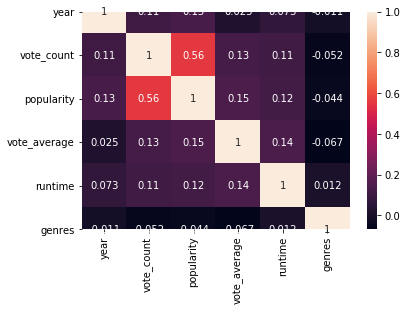

In [68]:
corr_matrix = movies.corr()
sns.heatmap(corr_matrix, annot=True)

In [69]:
movies = movies[movies['vote_count']>35]
movies = movies[movies['runtime']>0]

In [70]:
movies.shape

(11056, 7)

In [71]:
X = movies.drop('genres', axis=1)
y = movies['genres']

print(X.shape, y.shape)

(11056, 6) (11056,)


In [72]:
X_scaled = MinMaxScaler().fit_transform(X.drop('original_title',axis=1))

In [73]:
X_scaled= pd.DataFrame(X_scaled, index=movies.index, columns=movies.columns[:-2])

In [74]:
X_scaled.head()

,year,vote_count,popularity,vote_average,runtime
0,0.820,0.383,0.040,0.763,0.091
1,0.820,0.169,0.031,0.658,0.118
2,0.820,0.004,0.021,0.605,0.114
4,0.820,0.010,0.015,0.500,0.120
5,0.820,0.132,0.033,0.763,0.193


In [75]:
Sum_of_squared_distances = []

K = range(1,21)
for k in K:
    kmeans = KMeans(n_clusters=k, n_init=20, random_state=123)
    kmeans = kmeans.fit(X_scaled)
    Sum_of_squared_distances.append(kmeans.inertia_)

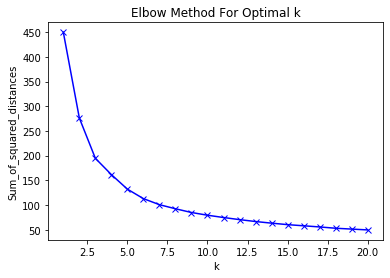

In [76]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

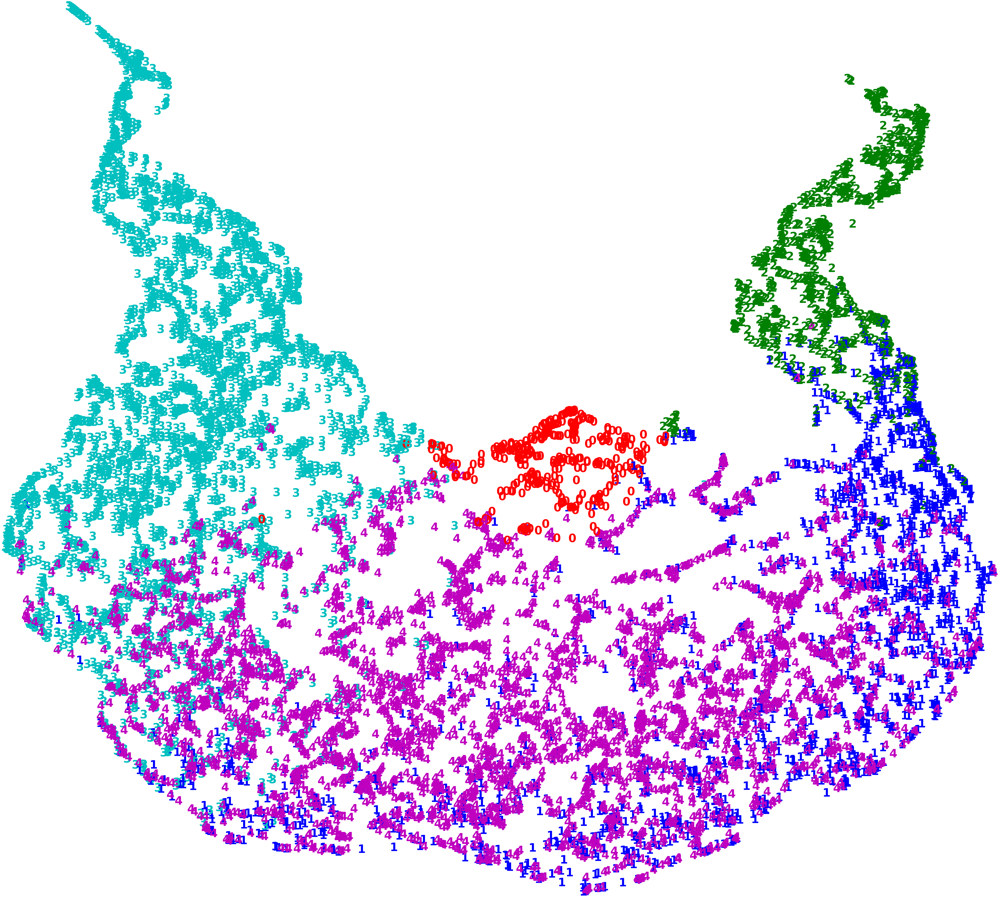

In [77]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=5, random_state=123)

# Fit model
kmeans_cluster.fit(X_scaled)
y_pred = kmeans_cluster.predict(X_scaled)

umap_results = umap.UMAP(n_neighbors=10,
                      min_dist=0.2,
                      metric='correlation').fit_transform(X_scaled)

colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y_pred[i],
             color=colours[int(y_pred[i])],
             fontdict={'weight': 'bold', 'size': 80}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [78]:
kmeans = KMeans(n_clusters=5)
kmeans.fit(X_scaled)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [79]:
len(kmeans.labels_)

11056

In [80]:
movies['cluster'] = kmeans.labels_

In [81]:
movies.head()

,year,vote_count,popularity,vote_average,runtime,genres,original_title,cluster
0,1995,5415.000,21.947,7.700,81.000,2,Toy Story,4
1,1995,2413.000,17.016,6.900,104.000,1,Jumanji,3
2,1995,92.000,11.713,6.500,101.000,14,Grumpier Old Men,3
4,1995,173.000,8.388,5.700,106.000,3,Father of the Bride Part II,0
5,1995,1886.000,17.925,7.700,170.000,0,Heat,1


In [82]:
movies.groupby('cluster')['vote_average'].mean()

cluster
0   5.334
1   6.803
2   7.246
3   6.547
4   7.207
Name: vote_average, dtype: float64

### Collaborative Filtering with Pearson Correlation

In [83]:
df3 = pd.read_csv('ratings_small.csv')
df3 = df3.rename(columns={'movieId':'id'})
df3.head()

,userId,id,rating,timestamp
0,1,31,2.500,1260759144
1,1,1029,3.000,1260759179
2,1,1061,3.000,1260759182
3,1,1129,2.000,1260759185
4,1,1172,4.000,1260759205


In [84]:
ratings = pd.merge(df3, df, how='inner', on='id')

In [85]:
ratings = ratings[['id', 'original_title', 'userId', 'rating']]
ratings.head()

,id,original_title,userId,rating
0,1371,Rocky III,1,2.500
1,1371,Rocky III,4,4.000
2,1371,Rocky III,7,3.000
3,1371,Rocky III,19,4.000
4,1371,Rocky III,21,3.000


In [86]:
userRatings = ratings.pivot_table(index=['userId'],columns=['original_title'],values='rating')
userRatings.head()

original_title,!Women Art Revolution,'Gator Bait,'Twas the Night Before Christmas,...Più forte ragazzi!,00 Schneider - Jagd auf Nihil Baxter,10 Items or Less,10 Things I Hate About You,"10,000 BC",11'09''01 - September 11,12 + 1,12 Angry Men,13 Tzameti,1408,15 Minutes,16 Blocks,1724 기방난동사건,1942: A Love Story,1984,2 Days in Paris,"20,000 Leagues Under the Sea",2001: A Space Odyssey,2010,2046,2061 - Un anno eccezionale,21 Grams,24 Hour Party People,25th Hour,28 Days Later,28 Weeks Later,29th Street,2:37,3 Ninjas: High Noon at Mega Mountain,3 hommes et un couffin,300,33 sceny z życia,36 Fillette,"4 luni, 3 săptămîni și 2 zile",40 Days and 40 Nights,42nd Street,48 Hrs.,4: Rise of the Silver Surfer,5 Card Stud,5 Days of War,50 First Dates,54,5x2,69 - Sixtynine,7 vírgenes,8 Mile,8 femmes,88 Minutes,8:46,8½,9 Songs,95 Miles to Go,964 Pinocchio,99 francs,A Beautiful Mind,A Bridge Too Far,A Brief History of Time,A Canção de Lisboa,A Chorus Line,A Christmas Carol,A Christmas Story,A Clockwork Orange,A Close Shave,A Countess from Hong Kong,A Dandy in Aspic,A Dangerous Method,A Few Good Men,A Guide To Recognizing Your Saints,A Guide for the Married Man,A Hard Day's Night,A History of Violence,A Kiss Before Dying,"A Man, a Woman and a Bank",A Mighty Heart,A Máquina,A Night in Heaven,A Nightmare on Elm Street,A Perfect Murder,A Pyromaniac's Love Story,A River Runs Through It,A Scanner Darkly,A Shot in the Dark,A Star Is Born,A Streetcar Named Desire,A Tale of Two Cities,A Time for Killing,A Time to Kill,A View to a Kill,A2,Aamdani Atthanni Kharcha Rupaiya,Abel,About Schmidt,About a Boy,Abraham,Abre los ojos,Absolon,Absolute Giganten,Absolute Power,Across the Universe,Adams æbler,Adaptation.,Addams Family Values,Addicted to Love,Adieu l'ami,Adrenalin: Fear the Rush,Adventures Of A Taxi Driver,Ae Fond Kiss...,Affair in Havana,Age of Consent,"Aguirre, der Zorn Gottes",Ah ! Les belles bacchantes,"Air: Eating, Sleeping, Waiting and Playing",Airplane!,Aladin,Alamar,Alexander,Alice in den Städten,Alice's Restaurant,Alien,Aliens,Aliens vs Predator: Requiem,Alive,All About Eve,All Stars,All the King's Men,All the President's Men,Alles auf Zucker!,Almost Famous,Along Came Polly,Along Came a Spider,Alraune,Alvin and the Chipmunks,Always Outnumbered,Am Ende Kommen Touristen,Amadeus,Amelia,American Beauty,American Graffiti,American Grindhouse,American History X,American Mullet,American Pie,American Pie 2,American Pie Presents: The Naked Mile,American Psycho,American Splendor,American Wedding,"Amico, stammi lontano almeno un palmo",Amores perros,Amos & Andrew,Amsterdamned,An American Tail,An American in Paris,An Angel at My Table,An Ideal Husband,An Unfinished Life,Ana y los otros,Anatomie de l'enfer,Anatomy of a Murder,Anchorman: The Legend of Ron Burgundy,And Then There Were None,And the Band Played On,"André Hazes, Zij Gelooft in Mij",Angel Baby,Angel Face,Angel Heart,Angels and Insects,Angst essen Seele auf,Angustia,Anima Mundi,Anma to onna,Anne of the Indies,Annie Hall,Annie's Point,Antikörper,Antoine et Colette,Antonia,Antz,Apartment Zero,Apocalypse Now,Apollo 13,Appointment with Death,Arctic Tale,Arena,Ariel,Arlington Road,Armageddon,Armed and Dangerous,Army of Darkness,Around the World in Eighty Days,Arthur et la vengeance de Maltazard,As Good as It Gets,Ascenseur pour l'échafaud,Ask the Dust,Astérix & Obélix Mission Cléopâtre,Astérix aux Jeux Olympiques,Asylum,At Long Last Love,At Risk,Atlantis: Milo's Return,Atonement,Attack of the Killer Tomatoes!,Auf der anderen Seite,Austin High,Austin Powers in Goldmember,Austin Powers: International Man of Mystery,Avalon,Away from Her,Azuloscurocasinegro,B. Monkey,Babel,Babes in Toyland,Babysitter Wanted,Baciami Ancora,Back to the Future,Back to the Future Part II,Back to the Future Part III,Backdraft,Bad Boys II,Bad Girls Go to Hell,Badlands,Baise-moi,Baisers volés,Ballo a tre passi,Bambi Meets Godzilla,Bandidas,Bandido!,Bandyta,Bang Boom Bang - Ein todsicheres Ding,Barda,Barfuß,Barking Water,Barocco,Barr

In [87]:
userRatings.shape

(671, 2793)

In [88]:
# Drop movies which have less than 10 users who rated it and fill NA with 0
userRatings = userRatings.dropna(thresh=10, axis=1).fillna(0)

In [89]:
userRatings.head()

original_title,...Più forte ragazzi!,10 Items or Less,12 + 1,2 Days in Paris,"20,000 Leagues Under the Sea",2001: A Space Odyssey,24 Hour Party People,25th Hour,28 Days Later,28 Weeks Later,300,"4 luni, 3 săptămîni și 2 zile",42nd Street,48 Hrs.,5 Card Stud,5x2,7 vírgenes,8 Mile,8 femmes,88 Minutes,A Bridge Too Far,A Brief History of Time,A Clockwork Orange,A Close Shave,A Kiss Before Dying,A Nightmare on Elm Street,A Perfect Murder,A River Runs Through It,A Shot in the Dark,A Tale of Two Cities,A Time to Kill,A View to a Kill,Abraham,Adams æbler,Addicted to Love,Adieu l'ami,"Aguirre, der Zorn Gottes",Alexander,Alien,Aliens vs Predator: Requiem,All the King's Men,Almost Famous,Am Ende Kommen Touristen,American Beauty,American Graffiti,American History X,American Pie,American Pie 2,American Psycho,"Amico, stammi lontano almeno un palmo",An Unfinished Life,Anatomie de l'enfer,Anatomy of a Murder,And Then There Were None,"André Hazes, Zij Gelooft in Mij",Angst essen Seele auf,Antoine et Colette,Antonia,Apocalypse Now,Ariel,Arlington Road,Armageddon,Ascenseur pour l'échafaud,Ask the Dust,Astérix aux Jeux Olympiques,At Risk,Auf der anderen Seite,Austin Powers in Goldmember,Avalon,Back to the Future,Back to the Future Part II,Back to the Future Part III,Bad Boys II,Baise-moi,Ballo a tre passi,Bandido!,Bandyta,Bang Boom Bang - Ein todsicheres Ding,Barda,Barking Water,Barry Lyndon,Barton Fink,Basquiat,Batman & Robin,Batman Begins,Batman Returns,Bean,Beat,Beavis and Butt-Head Do America,Because I Said So,Beetlejuice,Before Sunrise,Being John Malkovich,"Bell, Book and Candle",Belle Époque,Ben X,Bend It Like Beckham,Beowulf,Berlin: Die Sinfonie der Grosstadt,Best Seller,Best Worst Movie,Beverly Hills Cop III,Beyond Rangoon,Big Bad Mama,Big Fish,Big Girls Don't Cry... They Get Even,Big Time,Birdman of Alcatraz,Black Rain,Blackmail,Blade Runner,Blind Date,Blood Diamond,Blood: The Last Vampire,Boat,Bollywood/Hollywood,Bonnie and Clyde,Boogie Nights,Bordertown,Brake,Breakfast at Tiffany's,Breaking and Entering,Breaking the Waves,Bride of Frankenstein,Bridge to Terabithia,Brigham Young,Bring It On,Bringing Up Baby,Broken Blossoms,Broken Flowers,Brother,Brothers,Buddenbrooks,Bullitt,Captain Corelli's Mandolin,Carla's Song,Carne trémula,Carry On Cleo,Carry On Doctor,Carry On Screaming,Cars,Casablanca,Casino,Cat on a Hot Tin Roof,Catch Me If You Can,Catwoman,Cesare deve morire,Changing Lanes,Charlie's Angels,Cinderella Man,Citizen Kane,City Lights,City of Hope,"Clean, Shaven",Cleopatra Jones and the Casino of Gold,Closer,Cold Mountain,Color of Night,Comanche Station,Con Air,Confession of a Child of the Century,Conquest of the Planet of the Apes,Cool Hand Luke,Cop Land,Copying Beethoven,"Cousin, Cousine",Crank,Crime of Passion,Critters,Crustacés et coquillages,"Csillagosok, Katonák",Cube,Cutaway,Cutthroat Island,Cyberjack,Czlowiek z zelaza,Człowiek z marmuru,D.E.B.S.,Dancer in the Dark,Dances with Wolves,Das Cabinet des Dr. Caligari,Das Experiment,Das Wunder von Bern,Das weisse Rauschen,Das wilde Leben,Dave Chappelle's Block Party,David,Dawn of the Dead,Dead Man,Dead Poets Society,Dear Frankie,Death Machine,Death Proof,Deconstructing Harry,Deep Blue Sea,Der Himmel über Berlin,Der Schuh des Manitu,Der Tunnel,Der Untergang,Der letzte Mann,Der rote Elvis,Det sjunde inseglet,Deux frères,Devil in the Flesh,Dial M for Murder,Diarios de motocicleta,Die Brücke,Die Büchse der Pandora,Die Ehe der Maria Braun,Die Frau mit den 5 Elefanten,Die Hard,Die Hard 2,Die Höhle des gelben Hundes,Die Legende von Paul und Paula,Die Mörder sind unter uns,Die Sehnsucht der Veronika Voss,Die fetten Jahre sind vorbei,Dirty Dancing,Disclosure,Doctor Zhivago,Dog Day Afternoon,Dogtown and Z-Boys,Dogville,Dollman vs. Demonic Toys,Domicile Conjugal,Don Juan DeMarco,Don Q Son of Zorro,Don't Come Knocking,Don't Look Now,Don't Make Waves,Donnie Darko,Dont Look Back,Downhill Racer,Dr. Cyclops,Dr. Jekyll and Mr. Hyde,Dracula vs. Frankenstein,Dragon Hunter,Dragonslayer,Dreamgirls,Du r

In [90]:
# Build similarity matrix using Pearson Correlation:
item_similarity_df = userRatings.corr(method='pearson')
item_similarity_df.head()

original_title,...Più forte ragazzi!,10 Items or Less,12 + 1,2 Days in Paris,"20,000 Leagues Under the Sea",2001: A Space Odyssey,24 Hour Party People,25th Hour,28 Days Later,28 Weeks Later,300,"4 luni, 3 săptămîni și 2 zile",42nd Street,48 Hrs.,5 Card Stud,5x2,7 vírgenes,8 Mile,8 femmes,88 Minutes,A Bridge Too Far,A Brief History of Time,A Clockwork Orange,A Close Shave,A Kiss Before Dying,A Nightmare on Elm Street,A Perfect Murder,A River Runs Through It,A Shot in the Dark,A Tale of Two Cities,A Time to Kill,A View to a Kill,Abraham,Adams æbler,Addicted to Love,Adieu l'ami,"Aguirre, der Zorn Gottes",Alexander,Alien,Aliens vs Predator: Requiem,All the King's Men,Almost Famous,Am Ende Kommen Touristen,American Beauty,American Graffiti,American History X,American Pie,American Pie 2,American Psycho,"Amico, stammi lontano almeno un palmo",An Unfinished Life,Anatomie de l'enfer,Anatomy of a Murder,And Then There Were None,"André Hazes, Zij Gelooft in Mij",Angst essen Seele auf,Antoine et Colette,Antonia,Apocalypse Now,Ariel,Arlington Road,Armageddon,Ascenseur pour l'échafaud,Ask the Dust,Astérix aux Jeux Olympiques,At Risk,Auf der anderen Seite,Austin Powers in Goldmember,Avalon,Back to the Future,Back to the Future Part II,Back to the Future Part III,Bad Boys II,Baise-moi,Ballo a tre passi,Bandido!,Bandyta,Bang Boom Bang - Ein todsicheres Ding,Barda,Barking Water,Barry Lyndon,Barton Fink,Basquiat,Batman & Robin,Batman Begins,Batman Returns,Bean,Beat,Beavis and Butt-Head Do America,Because I Said So,Beetlejuice,Before Sunrise,Being John Malkovich,"Bell, Book and Candle",Belle Époque,Ben X,Bend It Like Beckham,Beowulf,Berlin: Die Sinfonie der Grosstadt,Best Seller,Best Worst Movie,Beverly Hills Cop III,Beyond Rangoon,Big Bad Mama,Big Fish,Big Girls Don't Cry... They Get Even,Big Time,Birdman of Alcatraz,Black Rain,Blackmail,Blade Runner,Blind Date,Blood Diamond,Blood: The Last Vampire,Boat,Bollywood/Hollywood,Bonnie and Clyde,Boogie Nights,Bordertown,Brake,Breakfast at Tiffany's,Breaking and Entering,Breaking the Waves,Bride of Frankenstein,Bridge to Terabithia,Brigham Young,Bring It On,Bringing Up Baby,Broken Blossoms,Broken Flowers,Brother,Brothers,Buddenbrooks,Bullitt,Captain Corelli's Mandolin,Carla's Song,Carne trémula,Carry On Cleo,Carry On Doctor,Carry On Screaming,Cars,Casablanca,Casino,Cat on a Hot Tin Roof,Catch Me If You Can,Catwoman,Cesare deve morire,Changing Lanes,Charlie's Angels,Cinderella Man,Citizen Kane,City Lights,City of Hope,"Clean, Shaven",Cleopatra Jones and the Casino of Gold,Closer,Cold Mountain,Color of Night,Comanche Station,Con Air,Confession of a Child of the Century,Conquest of the Planet of the Apes,Cool Hand Luke,Cop Land,Copying Beethoven,"Cousin, Cousine",Crank,Crime of Passion,Critters,Crustacés et coquillages,"Csillagosok, Katonák",Cube,Cutaway,Cutthroat Island,Cyberjack,Czlowiek z zelaza,Człowiek z marmuru,D.E.B.S.,Dancer in the Dark,Dances with Wolves,Das Cabinet des Dr. Caligari,Das Experiment,Das Wunder von Bern,Das weisse Rauschen,Das wilde Leben,Dave Chappelle's Block Party,David,Dawn of the Dead,Dead Man,Dead Poets Society,Dear Frankie,Death Machine,Death Proof,Deconstructing Harry,Deep Blue Sea,Der Himmel über Berlin,Der Schuh des Manitu,Der Tunnel,Der Untergang,Der letzte Mann,Der rote Elvis,Det sjunde inseglet,Deux frères,Devil in the Flesh,Dial M for Murder,Diarios de motocicleta,Die Brücke,Die Büchse der Pandora,Die Ehe der Maria Braun,Die Frau mit den 5 Elefanten,Die Hard,Die Hard 2,Die Höhle des gelben Hundes,Die Legende von Paul und Paula,Die Mörder sind unter uns,Die Sehnsucht der Veronika Voss,Die fetten Jahre sind vorbei,Dirty Dancing,Disclosure,Doctor Zhivago,Dog Day Afternoon,Dogtown and Z-Boys,Dogville,Dollman vs. Demonic Toys,Domicile Conjugal,Don Juan DeMarco,Don Q Son of Zorro,Don't Come Knocking,Don't Look Now,Don't Make Waves,Donnie Darko,Dont Look Back,Downhill Racer,Dr. Cyclops,Dr. Jekyll and Mr. Hyde,Dracula vs. Frankenstein,Dragon Hunter,Dragonslayer,Dreamgirls,Du r

In [91]:
def get_similar_movies(movie_name, user_rating):
  similarity_score = item_similarity_df[movie_name]*(user_rating)
  similarity_score = similarity_score.sort_values(ascending=False)

  return similarity_score

In [92]:
# Recommendation:
movie_list = [('24 Hour Party People',4), ('A Tale of Two Cities', 5)]

similar_movies = pd.DataFrame()

for movie, rating in movie_list:
  similar_movies = similar_movies.append(get_similar_movies(movie, rating), ignore_index=True)

similar_movies.head()
similar_movies.sum().sort_values(ascending=False)[2:].head(10)

Frankenstein                             2.577
Payback                                  2.572
8 femmes                                 2.499
Аэлита                                   2.490
Frances                                  2.462
Postal                                   2.434
Cleopatra Jones and the Casino of Gold   2.386
The Bachelor                             2.363
Married to the Mob                       2.315
Uncle Buck                               2.265
dtype: float64

### Collaborative Filtering using KNN

In [93]:
userRatings = ratings.pivot_table(index=['original_title'],columns=['userId'],values='rating').fillna(0)
userRatings.head()

userId,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,...,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671
original_title,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
!Women Art Revolution,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,3.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0

In [94]:
from scipy.sparse import csr_matrix

In [95]:
# Convert dataframe of movie features to scipy sparse matrix
userRatings_parse = csr_matrix(userRatings.values)

In [96]:
from sklearn.neighbors import NearestNeighbors
model_knn = NearestNeighbors(metric='cosine', algorithm='brute')

In [97]:
model_knn.fit(userRatings_parse)

NearestNeighbors(algorithm='brute', leaf_size=30, metric='cosine',
                 metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                 radius=1.0)

In [98]:
query_index = userRatings.index.get_loc('25th Hour')
query_index

26

In [99]:
distances, indices = model_knn.kneighbors(userRatings.iloc[query_index,:].values.reshape(1,-1),n_neighbors=10)

In [100]:
for i in range(0,len(distances.flatten())):
    if i==0:
        print("Recommendations for movie: {0}\n".format(userRatings.index[query_index]))
    else:
        print("{0}: {1}, with distance of {2}".format(i,userRatings.index[indices.flatten()[i]],distances.flatten()[i]))

Recommendations for movie: 25th Hour

1: ドールズ, with distance of 0.6497866092050351
2: The Hi-Lo Country, with distance of 0.6536893253026348
3: Frank Herbert's Dune, with distance of 0.6733206961117175
4: The Brothers Grimm, with distance of 0.6733206961117175
5: The Road to Hong Kong, with distance of 0.6733206961117175
6: Mr. Jones, with distance of 0.6733206961117175
7: Italiensk for begyndere, with distance of 0.6838379054824184
8: Total Recall, with distance of 0.6918309027961742
9: Michael Clayton, with distance of 0.6966858809451074
